In [7]:
# modules
import scipy.io
from scipy import signal
import numpy as np
import matplotlib.pyplot as plt
from JupyterFiles.filter import filterEMG2
from JupyterFiles.EMG import EMGcell2mat
# functions

def DEMUSEoutputReaderEMG(filepath): #DEMUSE runs both the CKC, clustering to threshold the IPTs and optional cleaning of spikes that you don't think are true activations ... thinks this has been clearned. but can check by thresholding the IPTs and seeing if the timestamps match the actual
    # didnt need much clearning, didnt get many MUs but ones did get were very clearn
    
    obj = dict()

    ## LOAD THE FILE
    mf = scipy.io.loadmat(filepath)
    
    obj['data'] = mf['MUPulses'] # firing time of each MUP. This is the timestamps, where is firing 
    obj['PNR'] = mf['PNR'] #of each MU? of the 4 #careful with some of the variables .. not working as are lists in lists
    obj['IPTs'] = mf['IPTs'] # spiking signal of each MU #determined by sampling rate ... is the sparse output, tries to maximise sparsity, but bcs is converging will never be true. correlation matrix saying where the template correlates 
    # can threshold ... anyhting above a certain value ... scipy.signal has a find peaks method, will find the peaks according to a set threshold
    obj['fsamp'] = float(mf['fsamp']) # sampling f
    obj['IED'] = mf['IED'] # interrelectrode distance
    obj['disChanVect'] = mf['discardChannelsVec']
    obj['ref_signal'] = mf['ref_signal']
    obj['muscle'] = mf['description'] #which muscle was recorded under the grid
    obj['startDeco'] = mf['startSIGInt']
    obj['stopDeco'] = mf['stopSIGInt'] #is just, default ... divide the EMG length  by sampling rate will get the time
    
    if ('SIG' in mf):
        SIG = np.reshape(mf["SIG"],[np.prod(np.shape(mf["SIG"])),1]) #SIG file /CO load map. Get the file as a list of 1 by observation for eah channel so needs reshaping 
        EMG = EMGcell2mat(SIG) #converts to a matrix form?
    
    obj['EMG'] = filterEMG2(EMG,obj['fsamp']) #butterworth filter to the data
        
    return obj, mf

In [250]:
import numpy as np
import matplotlib.pyplot as plt

def plotemg(signal, legend = [],channels = None, fsamp = 1, nsamps = None, iniz = 1, f_hold = 0, color = ['k','k','k','k','k','k','k','k','k'], vpp = [], title = '',lineWidth = 0.5):
    
    h = plt.figure(figsize=(17,10))
    
    if (signal.shape[1] < signal.shape[0]):
        signal = np.transpose(signal)

    if (channels != None and (len(channels) == 2)):
        signal = signal[channels[0]:channels[1], :]

    if (nsamps == None):
        nsamps = (signal.shape[1] - 1)
    
    if ((iniz + nsamps) > signal.shape[1]):
        nsamps = (signal.shape[1] - iniz)
    
    vpp = np.array(vpp)
    if (vpp.shape == (0,)):
        
        if (vpp ==  0):
            vpp = np.amax(signal[:, (iniz):(nsamps + iniz)])*0.9
        elif (vpp == -1):
            vpp = np.amax(signal[:, (iniz):(nsamps + iniz)], 1)#*np.ones((1,signal.shape[1]))
            print('Normalization intrachannel')
        else:
            vpp = np.amax(signal[:, (iniz):(nsamps + iniz)])*0.9

    t = np.arange(((iniz)/fsamp), ((nsamps + iniz)/fsamp), 1/fsamp)
    
    for j in range(signal.shape[0]):
        
        if (vpp.shape == ()):
            plt.plot(t, ((signal[j, (iniz):(nsamps + iniz)])/vpp)+(signal.shape[0] - j), color = color[j], linewidth = lineWidth)
        else:
            #if (vpp.shape == signal[j, (iniz):(nsamps+iniz)].shape):
            if (vpp.shape[0] == signal.shape[0]):
                plt.plot(t, ((signal[j, (iniz):(nsamps + iniz)])/vpp[j])+(signal.shape[0] - j), color = color[j], linewidth = lineWidth)

    plt.rc('font', size = 12)

    if fsamp > 1000:
        plt.xlabel('Time (s)', fontsize = 14, fontweight = 'bold')
        plt.ylabel('Recordings', fontsize = 14, fontweight = 'bold')

    plt.title(title, fontsize = 18, fontweight = 'bold',pad = 40)
    
    plt.legend(legend)
    
    plt.show()
    

    return vpp, h

<ipython-input-63-d8db7e332c97>:23: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if (vpp == 0):
<ipython-input-63-d8db7e332c97>:25: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  elif (vpp == -1):


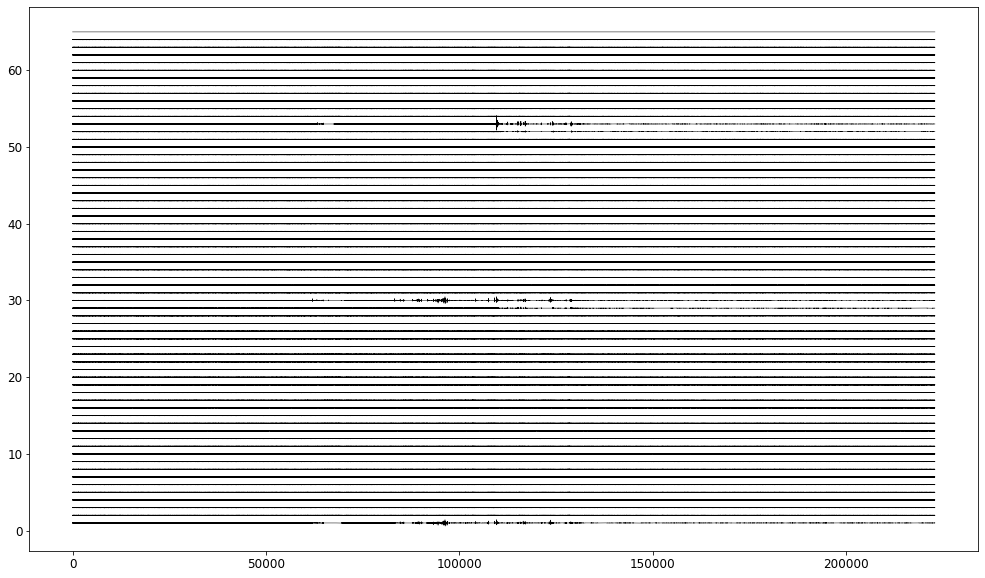

(4568.731199976567, <Figure size 1224x720 with 1 Axes>)

In [69]:
plotEMG(emg_signal['EMG'])

In [337]:
# Computing information
samples_per_recording = len(emg_signal['EMG'][0])
sampling_frequency = emg_signal['fsamp']
sample_length_seconds = samples_per_recording/ sampling_frequency

number_electrodes = len(emg_signal['EMG'][:,0])
number_observations = 0
for i in range(number_recordings):
    if emg_signal['EMG'][i].sum() != 0:
        number_observations = number_observations +1
        
'''Min and Max signals and range, removing anomalies'''

max_signals = []
min_signals = []
avg_signals = []

for signal in emg_signal['EMG']:
    max_signals.append(max(signal))
    min_signals.append(min(signal))
    avg_signals.append((signal).mean())

max_signals_rounded = []
min_signals_rounded = []
avg_signals_rounded = []

for elem in max_signals:
    rounded = np.around(elem, 2)
    max_signals_rounded.append(rounded)
    
for elem in min_signals:
    rounded = np.around(elem, 2)
    min_signals_rounded.append(rounded)
    
for elem in avg_signals:
    rounded = np.around(elem, 2)
    avg_signals_rounded.append(rounded)

max_signals_rounded_avg = (sum(max_signals_rounded))/len(max_signals_rounded)

max_signals_rounded_excl_f = max_signals_rounded.copy() # copy so that are not both modified by remove below
max_signals_rounded_excl_f.remove(max_signals_rounded_excl_f[0])
max_signals_range = max(max_signals_rounded_excl_f) - min(max_signals_rounded_excl_f)

max_signals_rounded_avg_excl_f = max_signals_rounded.copy()
max_signals_rounded_avg_excl_f.remove(max_signals_rounded_avg_excl_f[0])
max_signals_rounded_avg_excl_f = (sum(max_signals_rounded_avg_excl_f))/len(max_signals_rounded_avg_excl_f)


min_signals_rounded_avg = (sum(min_signals_rounded))/len(min_signals_rounded)

min_signals_rounded_excl_f = min_signals_rounded.copy() # copy so that are not both modified by remove below
min_signals_rounded_excl_f.remove(min_signals_rounded_excl_f[0])
min_signals_range = max(min_signals_rounded_excl_f) - min(min_signals_rounded_excl_f)

min_signals_rounded_avg_excl_f = min_signals_rounded.copy()
min_signals_rounded_avg_excl_f.remove(min_signals_rounded_avg_excl_f[0])
min_signals_rounded_avg_excl_f = (sum(min_signals_rounded_avg_excl_f))/len(min_signals_rounded_avg_excl_f)

signals_greater_than_avg = []

for i in range(len(max_signals_rounded)):
    if max_signals_rounded[i] > max_signals_rounded_avg:
        signals_greater_than_avg.append((max_signals_rounded[i], min_signals_rounded[i]))
print(signals_greater_than_avg)

'''Making the graph for the EMG '''


recording_possible_mus = []
recording_possible_mus_legend = []

for i in range(len(max_signals_rounded)):
    if max_signals_rounded[i] > max_signals_rounded_avg:
        recording_possible_mus.append(emg_signal['EMG'][i])
        recording_possible_mus_legend.append('Recording %s' %i)

[(5076.37, -3713.34), (635.59, -457.18), (2242.19, -1872.45), (732.2, -463.3), (1981.99, -1864.95)]


In [305]:
# Collected info
print('sample_length_seconds',sample_length_seconds) #108.84619140625
print('number_electrodes',number_electrodes) #65
print('number_observations',number_observations) #64
print('sampling frequency',sampling_frequency) #64
print('number of channels discarded',emg_signal['disChanVect'].sum())
print('interelectrode distance ', emg_signal['IED'][0][0])
print('muscles recorded from', emg_signal['muscle'])
print('\n')
print('SIGNAL INFORMATION')
print('number of signals that differed from the average', len(signals_greater_than_avg)) # computed by finding those that were greater than the average max
print('number of MUs recorded as detected by CKC', len(emg_signal['data'][0]))
print(signals_greater_than_avg)
print('\n')
print('max signals',max_signals_rounded, '\naverage',np.around(max_signals_rounded_avg,2), '\naverage excl first',np.around(max_signals_rounded_avg_excl_f,2), '\nrange excl first', np.around(max_signals_range,2))
print('\n')
print('min signals',min_signals_rounded, '\naverage',np.around(min_signals_rounded_avg,2), '\naverage excl first',np.around(min_signals_rounded_avg_excl_f,2), '\nrange excl first', np.around(min_signals_range,2))

sample_length_seconds 108.84619140625
number_electrodes 65
number_observations 64
sampling frequency 2048.0
number of channels discarded 7
interelectrode distance  4
muscles recorded from [' ABD DIG MIN ']


SIGNAL INFORMATION
number of signals that differed from the average 5
number of MUs recorded as detected by CKC 4
[(5076.37, -3713.34), (635.59, -457.18), (2242.19, -1872.45), (732.2, -463.3), (1981.99, -1864.95)]


max signals [0.0, 239.77, 239.95, 238.66, 240.27, 238.61, 238.59, 239.27, 240.38, 238.57, 239.3, 240.18, 5076.37, 635.59, 240.04, 241.26, 243.2, 242.87, 239.48, 238.64, 242.39, 242.62, 240.11, 241.92, 241.91, 240.39, 241.87, 241.94, 241.98, 240.78, 243.38, 243.48, 241.95, 243.15, 244.69, 2242.19, 732.2, 242.73, 242.32, 241.28, 242.81, 242.35, 244.96, 242.83, 243.5, 240.67, 243.77, 243.45, 241.64, 245.19, 235.86, 237.07, 237.56, 237.07, 236.71, 238.69, 237.3, 236.12, 236.26, 235.87, 238.06, 238.57, 236.88, 237.89, 1981.99] 
average 382.42 
average excl first 388.4 
range

<ipython-input-250-65f4563d64ac>:23: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if (vpp ==  0):
<ipython-input-250-65f4563d64ac>:25: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  elif (vpp == -1):


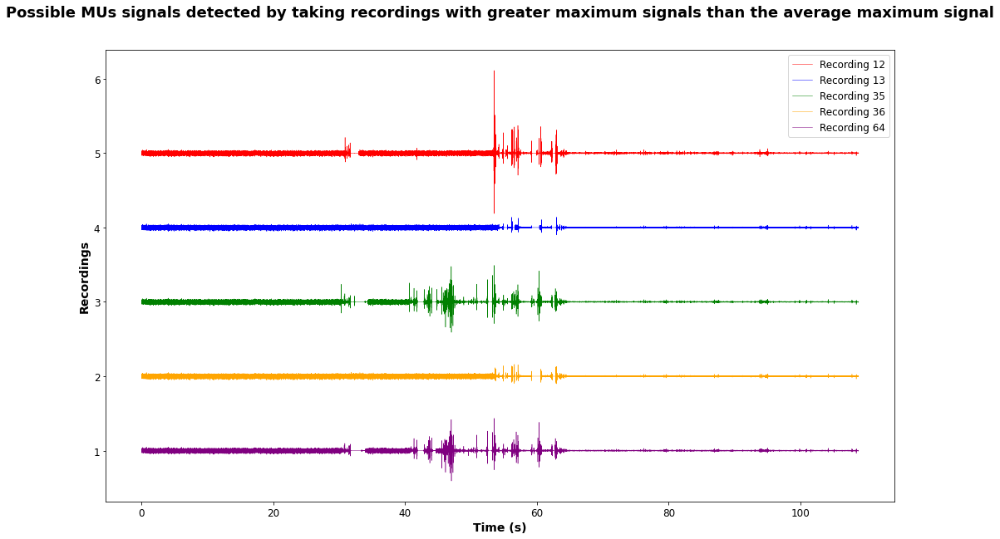

(4568.731199976567, <Figure size 1224x720 with 1 Axes>)

In [338]:
plotemg(np.array(recording_possible_mus), legend = recording_possible_mus_legend, color = ['red', 'blue', 'green', 'orange', 'purple', 'green','yellow','pink', 'black','k','k','k','k','k','k'],
       fsamp = sampling_frequency, title = 'Possible MUs signals detected by taking recordings with greater maximum signals than the average maximum signal')

In [422]:
# one MU in a numpy array
mu1 = emg_signal['data'][0][0][0]
mu1_timings =[]

for elem in mu1:
    new_elem = elem/sampling_frequency
    mu1_timings.append(new_elem)
    
print(np.around(mu1_timings,2))

print(emg_signal['data'][0][0][0])
emg_signal['EMG'].shape
222917/sampling_frequency

# print(emg_signal['EMG'][12][19563:20463]) # taken 12 as is one where signal is detected as shown above

print(emg_signal['EMG'][1]) # this is the location that the max value is found - likely to be a spike around here

timestamps = list(range(emg_signal['data'][0][0][0][93],emg_signal['data'][0][0][0][113])) # found this by looking at the timestamps of activity that were close

# plt.figure(figsize = (30,20)) 

# for i in range(0,9):
#     recordings = [1,2,20,11,12,13,35,36,64]
#     plt.subplot(3,3,i+1) # normally would start from 0, but here is from 1 - is only thing. subplots is different fucntion that works a bit different
#     plt.errorbar(timestamps, emg_signal['EMG'][recordings[i]][timestamps])
#     plt.title('Recording %s'%recordings[i], pad =10)
#     plt.xlabel('Time')
#     plt.ylabel('Signal')


plt.figure(figsize = (200,120)) 

for i in range(0,65):
    plt.subplot(17,4,i+1) # normally would start from 0, but here is from 1 - is only thing. subplots is different fucntion that works a bit different
    plt.errorbar(timestamps, emg_signal['EMG'][i][timestamps])
    plt.title('Recording %s'%i, pad =10)
    plt.xlabel('Time')
    plt.ylabel('Signal')

[ 9.55  9.56  9.57  9.57  9.63  9.64  9.64  9.71  9.72  9.74  9.75  9.75
  9.77  9.78  9.81  9.82  9.83  9.89  9.92  9.96  9.98  9.99 19.53 19.54
 19.55 19.55 19.61 19.62 19.63 19.69 19.7  19.71 19.72 19.73 19.76 19.77
 19.78 19.79 19.86 19.87 19.91 19.91 19.94 19.97 19.97 29.5  29.51 29.52
 29.53 29.58 29.59 29.6  29.67 29.68 29.7  29.7  29.73 29.74 29.74 29.79
 29.8  29.87 29.88 29.9  29.91 29.93 29.96 29.99 30.   39.49 39.49 39.5
 39.51 39.52 39.57 39.58 39.58 39.65 39.65 39.68 39.69 39.71 39.71 39.72
 39.75 39.76 39.81 39.82 39.84 39.85 39.87 39.88 39.9  49.48 49.48 49.5
 49.5  49.55 49.56 49.56 49.63 49.64 49.66 49.67 49.69 49.7  49.75 49.76
 49.81 49.82 49.84 49.87 49.88 49.9  59.44 59.45 59.47 59.48 59.49 59.5
 59.51 59.52 59.58 59.59 59.62 59.62 59.64 59.65 59.7  59.71 59.72 59.77
 59.83 59.93]
[ 19563  19589  19590  19606  19718  19736  19746  19886  19903  19946
  19963  19974  20014  20029  20091  20117  20135  20263  20326  20390
  20449  20463  39998  40015  40030  40048  

In [306]:
# print(emg_signal['EMG']) # full emg 

print(emg_signal['data']) # firing time of each MUP. This is the timestamps, where is firing 
# print(emg_signal['PNR']) #of each MU? of the 4 #careful with some of the variables .. not working as are lists in lists
# print(emg_signal['IPTs'])  # spiking signal of each MU #determined by sampling rate ... is the sparse output, tries to maximise sparsity, but bcs is converging will never be true. correlation matrix saying where the template correlates
# print(emg_signal['startDeco'])
# print(emg_signal['stopDeco']) #is just, default ... divide the EMG length  by sampling rate will get the time

[[array([[ 19563,  19589,  19590,  19606,  19718,  19736,  19746,  19886,
         19903,  19946,  19963,  19974,  20014,  20029,  20091,  20117,
         20135,  20263,  20326,  20390,  20449,  20463,  39998,  40015,
         40030,  40048,  40163,  40180,  40205,  40331,  40348,  40360,
         40389,  40406,  40466,  40483,  40518,  40535,  40682,  40699,
         40768,  40784,  40834,  40892,  40906,  60421,  60444,  60460,
         60471,  60587,  60603,  60616,  60761,  60775,  60819,  60833,
         60882,  60900,  60909,  61010,  61025,  61172,  61186,  61234,
         61248,  61298,  61358,  61422,  61437,  80867,  80884,  80899,
         80916,  80935,  81034,  81051,  81070,  81196,  81213,  81262,
         81276,  81319,  81335,  81345,  81407,  81421,  81531,  81545,
         81590,  81605,  81657,  81672,  81723, 101327, 101343, 101369,
        101384, 101474, 101491, 101508, 101639, 101656, 101709, 101721,
        101764, 101780, 101889, 101905, 102015, 102031, 102080

In [307]:
19563/2048

9.55224609375